# Stitching Tutorial

The Workflow of the Stitching Pipeline can be seen in the following. Note that the image comes from the [OpenCV Documentation](https://docs.opencv.org/3.4/d1/d46/group__stitching.html).

![image stitching pipeline](https://github.com/opencv/opencv/blob/master/modules/stitching/doc/StitchingPipeline.jpg?raw=true)

Please Download the following images from the [stitching testdata repository](https://github.com/opencv/opencv_extra/tree/master/testdata/stitching) into the `opencv/apps/opencv_stitching_tool/opencv_stitching_tutorial` folder:

- weir_*.jpg
- budapest*.jpg
- exposure_error_*.jpg

With the following block, we allow ourself to import modules of the "opencv_stitching" package:

In [1]:
import os
import sys
module_path = os.path.abspath(os.path.join('..'))
sys.path.append(module_path)

With the following block, we allow displaying resulting images within the notebook:

In [2]:
from matplotlib import pyplot as plt
import cv2 as cv
import numpy as np

def plot_image(img, figsize_in_inches=(5,5)):
    fig, ax = plt.subplots(figsize=figsize_in_inches)
    ax.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
    plt.show()
    
def plot_images(imgs, figsize_in_inches=(5,5)):
    fig, axs = plt.subplots(1, len(imgs), figsize=figsize_in_inches)
    for col, img in enumerate(imgs):
        axs[col].imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
    plt.show()

## Resize Images

The first step is to resize the images to medium (and later to low) resolution. The class which can be used is the `ImageHandler` class. If the images should not be stitched on full resolution, this can be achieved by setting the `final_megapix` parameter to a number above 0. 

`ImageHandler(medium_megapix=0.6, low_megapix=0.1, final_megapix=-1)`

In [3]:
from opencv_stitching.image_handler import ImageHandler

img_handler = ImageHandler(final_megapix=2.5)
img_handler.set_img_names(['weir_1.jpg', 'weir_2.jpg', 'weir_3.jpg', 'weir_noise.jpg'])

medium_imgs = list(img_handler.resize_to_medium_resolution())
low_imgs = list(img_handler.resize_to_low_resolution(medium_imgs))
final_imgs = list(img_handler.resize_to_final_resolution())

**NOTE:** Everytime `list()` is called in this notebook means that the function returns a generator (generators improve the overall stitching performance). To get all elements at once we use `list(generator_object)`  

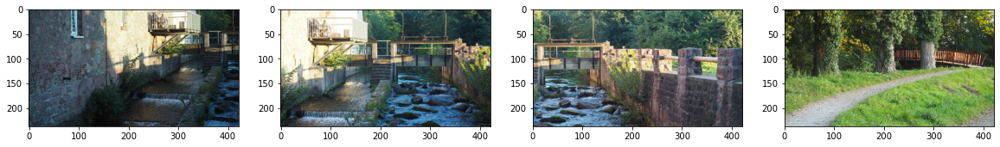

In [4]:
plot_images(low_imgs, (20,20))

In [5]:
original_size = img_handler.img_sizes[0]
medium_size = img_handler.get_image_size(medium_imgs[0])
low_size = img_handler.get_image_size(low_imgs[0])
final_size = img_handler.get_image_size(final_imgs[0])

print(f"Original Size: {original_size} -> {'{:,}'.format(np.prod(original_size))} px ~ 12 MP")
print(f"Medium Size:   {medium_size}  -> {'{:,}'.format(np.prod(medium_size))} px    ~ 0.6 MP")
print(f"Low Size:      {low_size}   -> {'{:,}'.format(np.prod(low_size))} px    ~ 0.1 MP")
print(f"Final Size:    {final_size} -> {'{:,}'.format(np.prod(final_size))} px  ~ 2.5 MP")

Original Size: (4608, 2592) -> 11,943,936 px ~ 12 MP
Medium Size:   (1033, 581)  -> 600,173 px    ~ 0.6 MP
Low Size:      (422, 237)   -> 100,014 px    ~ 0.1 MP
Final Size:    (2108, 1186) -> 2,500,088 px  ~ 2.5 MP


For the next steps we work with the Medium Images:

In [6]:
imgs = medium_imgs

## Find Features

On the medium images, we now want to find features that can describe conspicuous elements within the images which might be found in other images as well. The class which can be used is the `FeatureDetector` class. Default `detector` is SURF, if  [opencv_contrib](https://github.com/opencv/opencv_contrib) is not available, it's ORB.

`FeatureDetector(detector='surf'/'orb', nfeatures=500)`

In [7]:
from opencv_stitching.feature_detector import FeatureDetector

finder = FeatureDetector()
features = [finder.detect_features(img) for img in imgs]
keypoints_center_img = finder.draw_keypoints(imgs[1], features[1])

SURF not available
SIFT not available


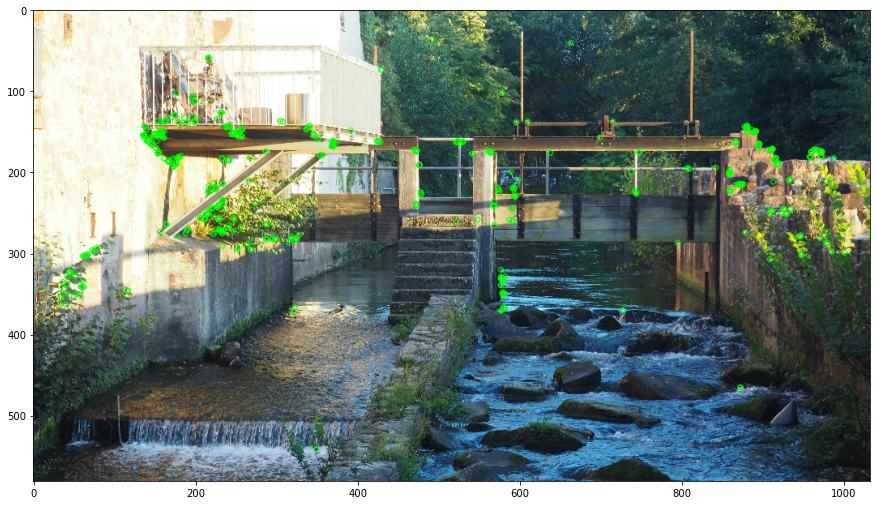

In [8]:
plot_image(keypoints_center_img, (15,10))

## Match Features

Now we can match the features of the pairwise images. The class which can be used is the FeatureMatcher class.

`FeatureMatcher(matcher_type='homography', range_width=-1)`

In [9]:
from opencv_stitching.feature_matcher import FeatureMatcher

matcher = FeatureMatcher()
matches = matcher.match_features(features)

We can look at the confidences, which are calculated by:

`confidence = number of inliers / (8 + 0.3 * number of matches)` (Lines 435-7 of [this file](https://github.com/opencv/opencv/blob/68d15fc62edad980f1ffa15ee478438335f39cc3/modules/stitching/src/matchers.cpp))

The inliers are calculated using the random sample consensus (RANSAC) method, e.g. in [this file](https://github.com/opencv/opencv/blob/68d15fc62edad980f1ffa15ee478438335f39cc3/modules/stitching/src/matchers.cpp) in Line 425. We can plot the inliers which is shown later.

In [10]:
matcher.get_confidence_matrix(matches)

array([[0.        , 2.24944321, 0.42016807, 0.51724138],
       [2.24944321, 0.        , 1.68639053, 0.4109589 ],
       [0.42016807, 1.68639053, 0.        , 0.33613445],
       [0.51724138, 0.4109589 , 0.33613445, 0.        ]])

It can be seen that:

- image 1 has a high matching confidence with image 2 and low confidences with image 3 and 4
- image 2 has a high matching confidence with image 1 and image 3 and low confidences with image 4
- image 3 has a high matching confidence with image 2 and low confidences with image 1 and 4
- image 4 has low matching confidences with image 1, 2 and 3

With a `confidence_threshold`, which is introduced in detail in the next step, we can plot the relevant matches with the inliers:

Matches Image 1 to Image 2


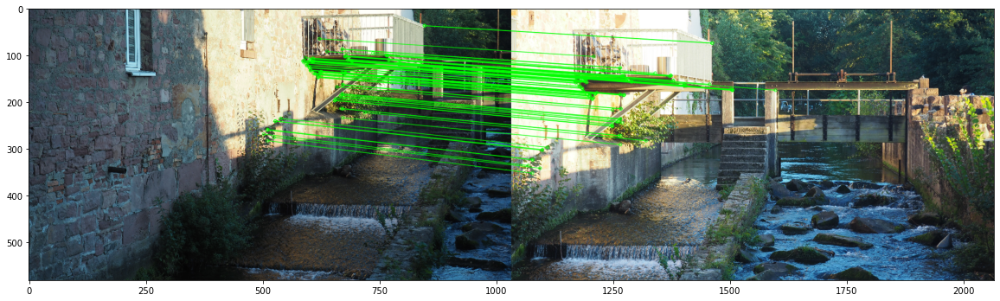

Matches Image 2 to Image 3


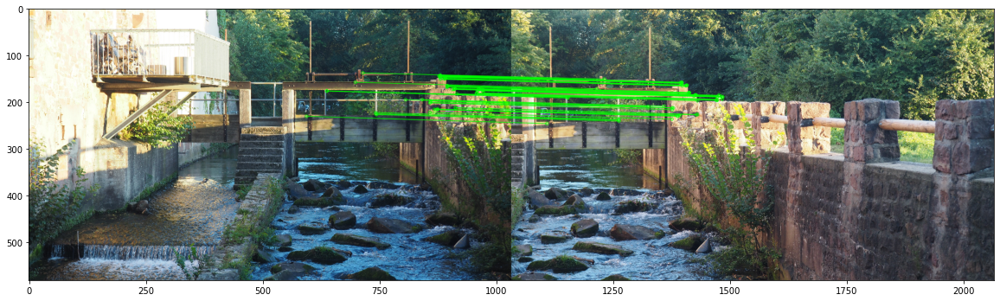

In [11]:
all_relevant_matches = matcher.draw_matches_matrix(imgs, features, matches, conf_thresh=1, 
                                                   inliers=True, matchColor=(0, 255, 0))

for idx1, idx2, img in all_relevant_matches:
    print(f"Matches Image {idx1+1} to Image {idx2+1}")
    plot_image(img, (20,10))

## Subset

Above we saw that the noise image has no connection to the other images which are part of the panorama. We now want to create a subset with only the relevant images. The class which can be used is the `Subsetter` class. We can specify the `confidence_threshold` from when a match is regarded as good match. We saw that in our case `1` is sufficient. For the parameter `matches_graph_dot_file` a file name can be passed, in which a matches graph in dot notation is saved. 

`Subsetter(confidence_threshold=1, matches_graph_dot_file=None)`

In [12]:
from opencv_stitching.subsetter import Subsetter

subsetter = Subsetter()
dot_notation = subsetter.get_matches_graph(img_handler.img_names, matches)
print(dot_notation)

graph matches_graph{
"weir_1.jpg" -- "weir_2.jpg"[label="Nm=123, Ni=101, C=2.24944"];
"weir_2.jpg" -- "weir_3.jpg"[label="Nm=86, Ni=57, C=1.68639"];
"weir_noise.jpg";
}


The matches graph visualizes what we've saw in the confidence matrix: image 1 conneced to image 2 conneced to image 3. Image 4 is not part of the panorama (note that the confidences can vary since this is a static image). 

<img src="./figures/match_graph.svg" alt="match_graph.svg" width="200"/>
<p style="text-align: center;"><a href="https://dreampuf.github.io/GraphvizOnline">GraphvizOnline</a> used to plot the graph </p>

We now want to subset all variables we've created till here, incl. the attributes `img_names` and `img_sizes` of the `ImageHandler`

In [13]:
names, sizes, imgs, features, matches = subsetter.subset(img_handler.img_names,
                                                         img_handler.img_sizes,
                                                         imgs, features, matches)

img_handler.img_names, img_handler.img_sizes = names, sizes

print(img_handler.img_names)
print(matcher.get_confidence_matrix(matches))

['weir_1.jpg', 'weir_2.jpg', 'weir_3.jpg']
[[0.         2.24944321 0.42016807]
 [2.24944321 0.         1.68639053]
 [0.42016807 1.68639053 0.        ]]


## Camera Estimation, Adjustion and Correction

With the features and matches we now want to calibrate cameras which can be used to warp the images so they can be composed correctly. The classes which can be used are `CameraEstimator`, `CameraAdjuster` and `WaveCorrector`:

```
CameraEstimator(estimator='homography')
CameraAdjuster(adjuster='ray', refinement_mask='xxxxx')
WaveCorrector(wave_correct_kind='horiz')
```

In [14]:
from opencv_stitching.camera_estimator import CameraEstimator
from opencv_stitching.camera_adjuster import CameraAdjuster
from opencv_stitching.camera_wave_corrector import WaveCorrector

camera_estimator = CameraEstimator()
camera_adjuster = CameraAdjuster()
wave_corrector = WaveCorrector()

cameras = camera_estimator.estimate(features, matches)
cameras = camera_adjuster.adjust(features, matches, cameras)
cameras = wave_corrector.correct(cameras)

## Estimate final Panorama Dimensions

With the obtained cameras we can now determine where in a final plane the warped images (we will calculate them later) will be. The module which can be used is `panorama_estimation.py` with the function 

`estimate_final_panorama_dimensions(cameras, warper, img_handler)`

The cameras and an `ImageHandler` are already defined. However, we need a Warper. The warper class is introduced in detail in the next point.

In [15]:
from opencv_stitching.warper import Warper
from opencv_stitching.panorama_estimation import estimate_final_panorama_dimensions

warper = Warper()
panorama_scale, panorama_corners, panorama_sizes = \
estimate_final_panorama_dimensions(cameras, warper, img_handler)

print(panorama_corners)
print(panorama_sizes)

[(-2153, 6221), (-1070, 6160), (-33, 6130)]
[(2364, 1338), (2071, 1177), (2073, 1179)]


The `panorama_scale` is mainly used internally for warping procedure. `panorama_corners` and `panorama_sizes` specify where the warped images will be located on the final panorama plane.

## Warp Images

With the obtained cameras we now want to warp the images itself into the final plane. The class which can be used is the `Warper` class:

`Warper(warper_type='spherical', scale=1)`

In [16]:
from opencv_stitching.warper import Warper

warper = Warper()

Warp low resolution images

In [17]:
camera_aspect = img_handler.get_medium_to_low_ratio()          # since cameras were obtained on medium imgs
scale = panorama_scale * img_handler.get_final_to_low_ratio()  # since scale was estimated on final img bboxes

warped_low_imgs, warped_low_masks, low_corners = zip(*list(
    warper.warp_images_and_image_masks(low_imgs, cameras, scale=scale, aspect=camera_aspect)))

Warp final resolution images

In [18]:
camera_aspect = img_handler.get_medium_to_final_ratio()        # since cameras were obtained on medium imgs

warped_final_imgs, warped_final_masks, final_corners = zip(*list(
    warper.warp_images_and_image_masks(final_imgs, cameras, scale=panorama_scale, aspect=camera_aspect)))

## Excursion: Timelapser

The Timelapser functionality is a nice way to grasp how the images are warped into a final plane. The class which can be used is the `Timelapser` class:

`Timelapser(timelapse='no')`

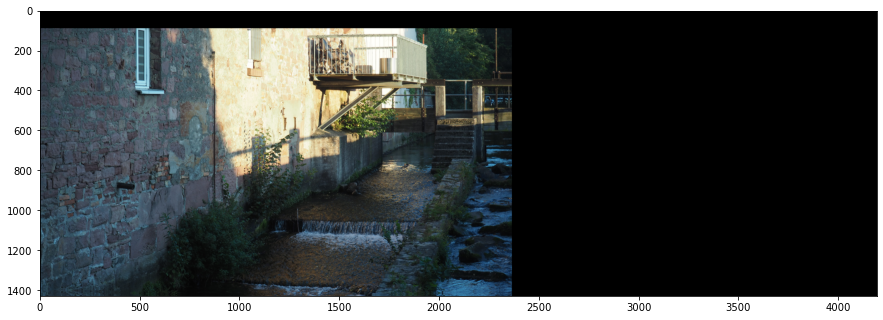

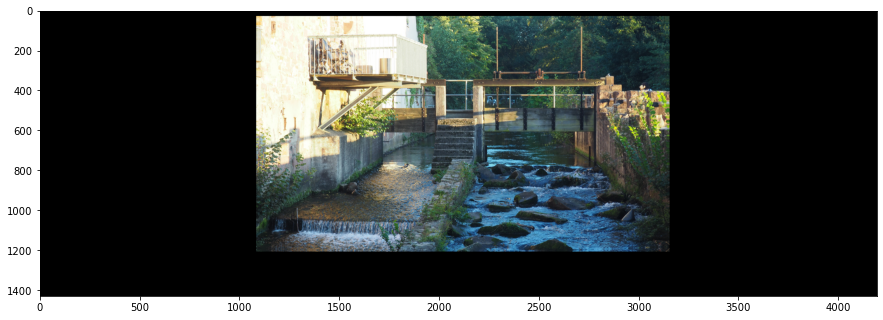

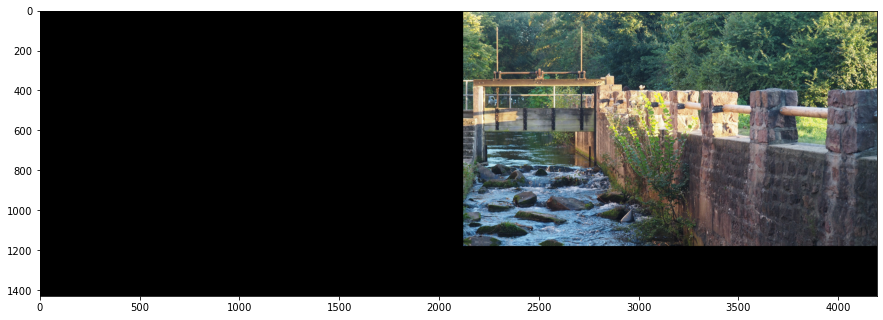

In [19]:
from opencv_stitching.timelapser import Timelapser

timelapser = Timelapser('as_is')
timelapser.initialize(panorama_corners, panorama_sizes)

for img, corner in zip(warped_final_imgs, final_corners):
    timelapser.process_frame(img, corner)
    frame = timelapser.get_frame()
    plot_image(frame, (15,10))

Now we need stategies how to compose the already overlaying images into one panorama image. Strategies are:

- Seam Masks
- Exposure Error Compensation
- Blending

## Seam Masks

Seam masks find a transition line between images with the least amount of interference. The class which can be used is the `SeamFinder` class:

`SeamFinder(finder='dp_color')`

The Seams are obtained on the warped low resolution images and then resized to the warped final resolution images. The Seam Masks can be used in the Blending step to specify how the images should be composed.

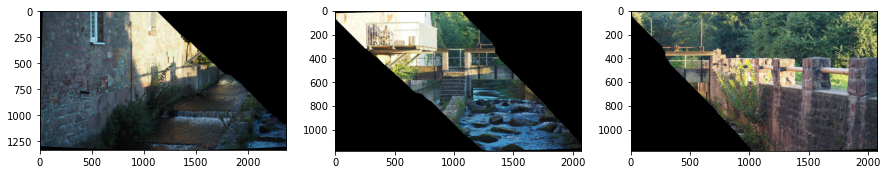

In [20]:
from opencv_stitching.seam_finder import SeamFinder

seam_finder = SeamFinder()

seam_masks = seam_finder.find(warped_low_imgs, low_corners, warped_low_masks)
seam_masks = [seam_finder.resize(seam_mask, mask) for seam_mask, mask in zip(seam_masks, warped_final_masks)]

seam_masks_plots = [SeamFinder.draw_seam_mask(img, seam_mask) for img, seam_mask in zip(warped_final_imgs, seam_masks)]
plot_images(seam_masks_plots, (15,10))

## Exposure Error Compensation

Frequently exposure errors respectively exposure differences between images occur which lead to artefacts in the final panorama. The class which can be used is the `ExposureErrorCompensator` class:

`ExposureErrorCompensator(compensator='gain_blocks', nr_feeds=1, block_size=32)`

The Exposure Error are estimated on the warped low resolution images and then applied on the warped final resolution images.

**Note:** In this example the compensation has nearly no effect and the result is not shown. To understand the stitching pipeline they are compensated anyway. A fitting example for images where Exposure Error Compensation is important can be found at the end of the notebook.   

In [21]:
from opencv_stitching.exposure_error_compensator import ExposureErrorCompensator

compensator = ExposureErrorCompensator()

compensator.feed(low_corners, warped_low_imgs, warped_low_masks)

compensated_imgs = [compensator.apply(idx, corner, img, mask) 
                    for idx, (img, mask, corner) 
                    in enumerate(zip(warped_final_imgs, warped_final_masks, final_corners))]

## Blending

With all the previous processing the images can finally be blended to a whole panorama. The class which can be used is the `Blender` class:

`Blender(blender_type='multiband', blend_strength=5)`

The blend strength thereby specifies on which overlap the images should be overlayed along the transitions of the masks. This is also visualized at the end of the notebook.

In [22]:
from opencv_stitching.blender import Blender

blender = Blender()
blender.prepare(panorama_corners, panorama_sizes)
for img, mask, corner in zip(compensated_imgs, seam_masks, final_corners):
    blender.feed(img, mask, corner)
panorama = blender.blend()

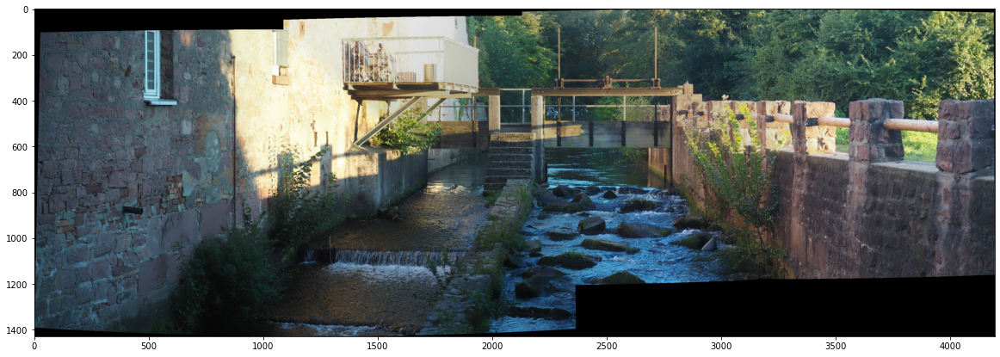

In [23]:
plot_image(panorama, (20,20))

There is the functionality to plot the seams as lines or polygons onto the final panorama to see which part of the panorama is from which image. The basis is to blend single colored dummy images with the obtained seam masks and panorama dimensions:

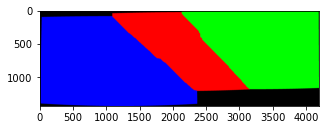

In [24]:
blended_seam_masks = seam_finder.blend_seam_masks(seam_masks, panorama_corners, panorama_sizes)
plot_image(blended_seam_masks, (5,5))

This blend can be converted into lines or weighted on top of the resulting panorama:

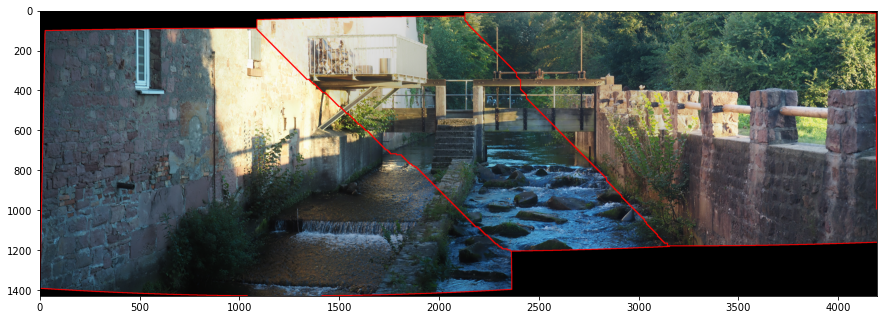

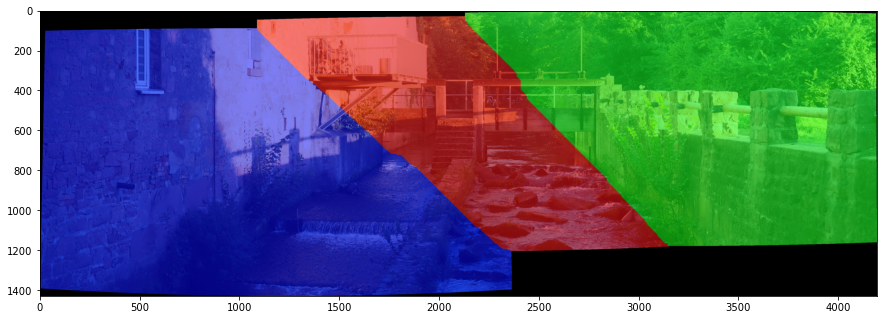

In [25]:
plot_image(seam_finder.draw_seam_lines(panorama, blended_seam_masks, linesize=3), (15,10))
plot_image(seam_finder.draw_seam_polygons(panorama, blended_seam_masks), (15,10))

## Crop

There are approaches [here](https://www.pyimagesearch.com/2018/12/17/image-stitching-with-opencv-and-python/) and [here](https://answers.opencv.org/question/73645/reconstruct-stitched-image/) to crop out the black surrounding, but its not implemented yet.

# Stitcher

All the functionality above is automated within the `Stitcher` class:

`Stitcher(**kwargs)`

In [26]:
from opencv_stitching.stitcher import Stitcher
stitcher = Stitcher(final_megapix=2.5) # to reduce processing time
panorama = stitcher.stitch(['weir_1.jpg', 'weir_2.jpg', 'weir_3.jpg', 'weir_noise.jpg'])

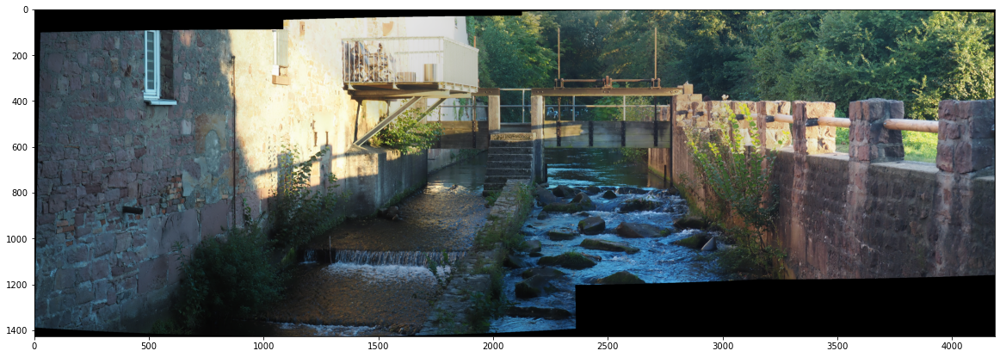

In [27]:
plot_image(panorama, (20,20))

## Affine Scans

For images that were obtained on e.g. a flatbed scanner affine transformations are sufficient. The next example shows which parameters need to be specified: 

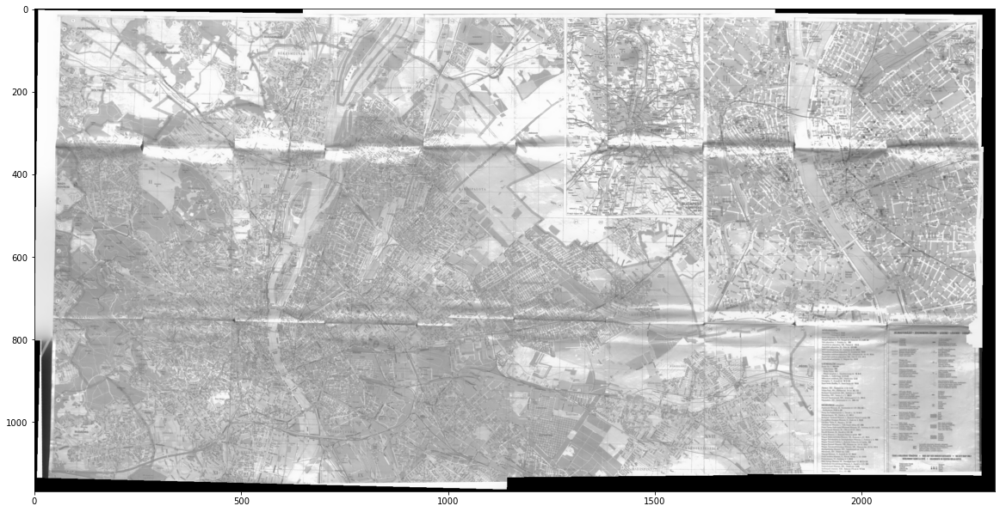

In [28]:
settings = {"matcher_type": "affine",   
            "estimator": "affine", 
            "adjuster": "affine",        
            "wave_correct_kind": "no",  
            "warper_type": "affine",      
            
            "confidence_threshold": 0.5}    

stitcher = Stitcher(**settings)
panorama = stitcher.stitch(["budapest1.jpg", "budapest2.jpg",
                            "budapest3.jpg", "budapest4.jpg",
                            "budapest5.jpg", "budapest6.jpg"])

plot_image(panorama, (20,20))

## Exposure Error and Blend Strenght Example

In [29]:
imgs = ['exposure_error_1.jpg', 'exposure_error_2.jpg']

stitcher = Stitcher(compensator="no", blender_type="no")
panorama1 = stitcher.stitch(imgs)

stitcher = Stitcher(compensator="no")
panorama2 = stitcher.stitch(imgs)

stitcher = Stitcher(compensator="no", blend_strength=20)
panorama3 = stitcher.stitch(imgs)

stitcher = Stitcher(blender_type="no")
panorama4 = stitcher.stitch(imgs)

stitcher = Stitcher(blend_strength=20)
panorama5 = stitcher.stitch(imgs)

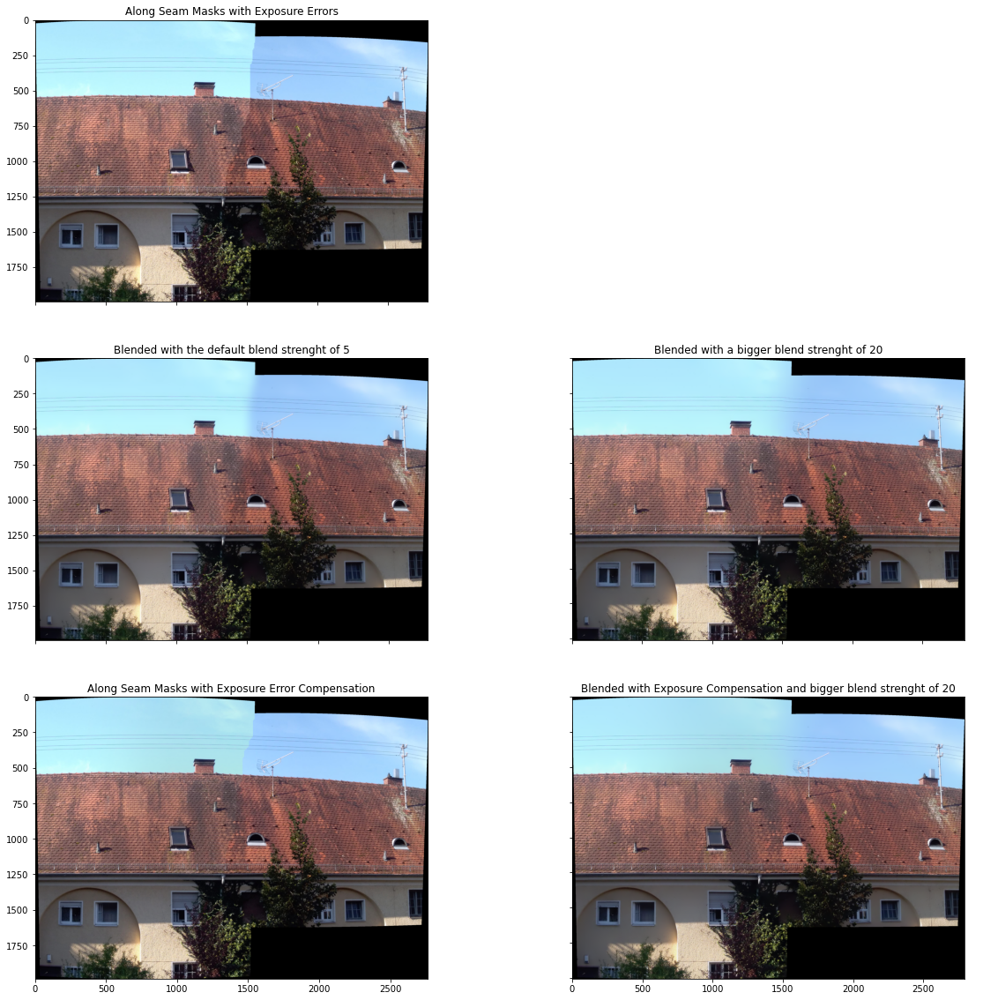

In [30]:
fig, axs = plt.subplots(3, 2, figsize=(20,20))
axs[0, 0].imshow(cv.cvtColor(panorama1, cv.COLOR_BGR2RGB))
axs[0, 0].set_title('Along Seam Masks with Exposure Errors')
axs[0, 1].axis('off')
axs[1, 0].imshow(cv.cvtColor(panorama2, cv.COLOR_BGR2RGB))
axs[1, 0].set_title('Blended with the default blend strenght of 5')
axs[1, 1].imshow(cv.cvtColor(panorama3, cv.COLOR_BGR2RGB))
axs[1, 1].set_title('Blended with a bigger blend strenght of 20')
axs[2, 0].imshow(cv.cvtColor(panorama4, cv.COLOR_BGR2RGB))
axs[2, 0].set_title('Along Seam Masks with Exposure Error Compensation')
axs[2, 1].imshow(cv.cvtColor(panorama5, cv.COLOR_BGR2RGB))
axs[2, 1].set_title('Blended with Exposure Compensation and bigger blend strenght of 20')

# Hide x labels and tick labels for top plots and y ticks for right plots.
for ax in axs.flat:
    ax.label_outer()